### 1) Extract reviews of any product from ecommerce website like amazon
### 2) Perform emotion mining


In [1]:
import re
import nltk
import spacy
import codecs
import requests

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from textblob import TextBlob
from bs4 import BeautifulSoup
from tqdm import tqdm_notebook
from wordcloud import WordCloud
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

import warnings
warnings.filterwarnings('ignore')

In [2]:
headers = {'authority': 'www.amazon.in',
           'accept-language': 'en-US,en;q=0.9',
           'referer': 'https://www.amazon.in/iQOO-Pacific-Snapdragon-Processor-44WFlashCharge/dp/B07WFP331D/ref=cm_cr_arp_d_product_top?ie=UTF8',
           'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/102.0.0.0 Safari/537.36'}

In [3]:
def get_soup(url):
    r = requests.get(url, headers=headers,
    params={'url': url, 'wait': 2})
    soup = BeautifulSoup(r.text, 'html.parser')
    return soup

In [4]:
reviewlist = []

# Function 2: look for web-tags in our soup, then append our data to reviewList
def get_reviews(soup):
    reviews = soup.find_all('div', {'data-hook': 'review'})
    try:
        for item in reviews:
            review = {
            'Rating':  float(item.find('i', {'data-hook': 'review-star-rating'}).text.replace('out of 5 stars', '').strip()),
            'Title': item.find('a', {'data-hook': 'review-title'}).text.strip(),
            'Review': item.find('span', {'data-hook': 'review-body'}).text.strip(),
            'Review_Date': item.find('span', {'data-hook': 'review-date'}).text.replace('Reviewed in India on', '').strip(),
            }
            reviewlist.append(review)
    except:
        pass

In [5]:
for x in tqdm_notebook(range(1600)):
    soup = get_soup(f'https://www.amazon.in/iQOO-Pacific-Snapdragon-Processor-44WFlashCharge/product-reviews/B07WFP331D/ref=cm_cr_arp_d_viewopt_srt?ie=UTF8&reviewerType=all_reviews&pageNumber=1&sortBy=recent&formatType=all_formats&filterByStar=all_stars={x}')
    #print(f'Getting page: {x}')
    get_reviews(soup)
    #print(len(reviewlist))
    if not soup.find('li', {'class': 'a-disabled a-last'}):
        pass
    else:
        break

  0%|          | 0/1600 [00:00<?, ?it/s]

In [7]:
df = pd.DataFrame(reviewlist)
df

,Rating,Title,Review,Review_Date
0,4.0,Nice,Please permanently remove blotware and unwante...,Reviewed in India 🇮🇳 on 8 June 2023
1,5.0,Battery,Charging is fast ⏩ and long-lasting battery,Reviewed in India 🇮🇳 on 8 June 2023
2,1.0,Waste of money,After 1week phone was hanging,Reviewed in India 🇮🇳 on 8 June 2023
3,1.0,Worst product,Too much hanging while general usage.. waste o...,Reviewed in India 🇮🇳 on 8 June 2023
4,5.0,Sooper,Like,Reviewed in India 🇮🇳 on 8 June 2023
...,...,...,...,...
12305,4.0,Nice product,Product is ok in given price range.,7 June 2023
12306,4.0,if you are looking for camera quality in the p...,"Worst part is Finger print sensor, not working...",7 June 2023
12307,5.0,Network issue in new handset,,7 June 2023
12308,4.0,Good phone,Good phone nice camera good battry life,7 June 2023


In [10]:
df["Review_Date"] = df["Review_Date"].replace('Reviewed in India on','', regex=True)
df["Review_Date"] = df["Review_Date"].replace('Reviewed in India 🇮🇳 on','', regex=True)

In [11]:
df

,Rating,Title,Review,Review_Date
0,4.0,Nice,Please permanently remove blotware and unwante...,8 June 2023
1,5.0,Battery,Charging is fast ⏩ and long-lasting battery,8 June 2023
2,1.0,Waste of money,After 1week phone was hanging,8 June 2023
3,1.0,Worst product,Too much hanging while general usage.. waste o...,8 June 2023
4,5.0,Sooper,Like,8 June 2023
...,...,...,...,...
12305,4.0,Nice product,Product is ok in given price range.,7 June 2023
12306,4.0,if you are looking for camera quality in the p...,"Worst part is Finger print sensor, not working...",7 June 2023
12307,5.0,Network issue in new handset,,7 June 2023
12308,4.0,Good phone,Good phone nice camera good battry life,7 June 2023


In [37]:
df.to_csv("IQQQ_Review.csv")

In [38]:
reviews = pd.read_csv('IQQQ_Review.csv')

In [39]:
reviews.head()

,Unnamed: 0,Rating,Title,Review,Review_Date
0,0,4.0,Nice,Please permanently remove blotware and unwante...,8 June 2023
1,1,5.0,Battery,Charging is fast ⏩ and long-lasting battery,8 June 2023
2,2,1.0,Waste of money,After 1week phone was hanging,8 June 2023
3,3,1.0,Worst product,Too much hanging while general usage.. waste o...,8 June 2023
4,4,5.0,Sooper,Like,8 June 2023


In [40]:
reviews.drop(['Unnamed: 0'],inplace=True,axis=1)
reviews.head()

,Rating,Title,Review,Review_Date
0,4.0,Nice,Please permanently remove blotware and unwante...,8 June 2023
1,5.0,Battery,Charging is fast ⏩ and long-lasting battery,8 June 2023
2,1.0,Waste of money,After 1week phone was hanging,8 June 2023
3,1.0,Worst product,Too much hanging while general usage.. waste o...,8 June 2023
4,5.0,Sooper,Like,8 June 2023


## Data Exploration

In [41]:
reviews.Rating.describe()

count    12310.000000
mean         3.600000
std          1.428344
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          5.000000
Name: Rating, dtype: float64

In [42]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12310 entries, 0 to 12309
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Rating       12310 non-null  float64
 1   Title        12310 non-null  object 
 2   Review       11079 non-null  object 
 3   Review_Date  12310 non-null  object 
dtypes: float64(1), object(3)
memory usage: 384.8+ KB


In [43]:
reviews.isna().sum()

Rating            0
Title             0
Review         1231
Review_Date       0
dtype: int64

In [44]:
reviews.dropna(subset=['Review'],inplace=True)
reviews.head()

,Rating,Title,Review,Review_Date
0,4.0,Nice,Please permanently remove blotware and unwante...,8 June 2023
1,5.0,Battery,Charging is fast ⏩ and long-lasting battery,8 June 2023
2,1.0,Waste of money,After 1week phone was hanging,8 June 2023
3,1.0,Worst product,Too much hanging while general usage.. waste o...,8 June 2023
4,5.0,Sooper,Like,8 June 2023


In [45]:
reviews.shape

(11079, 4)

## Data Visualization

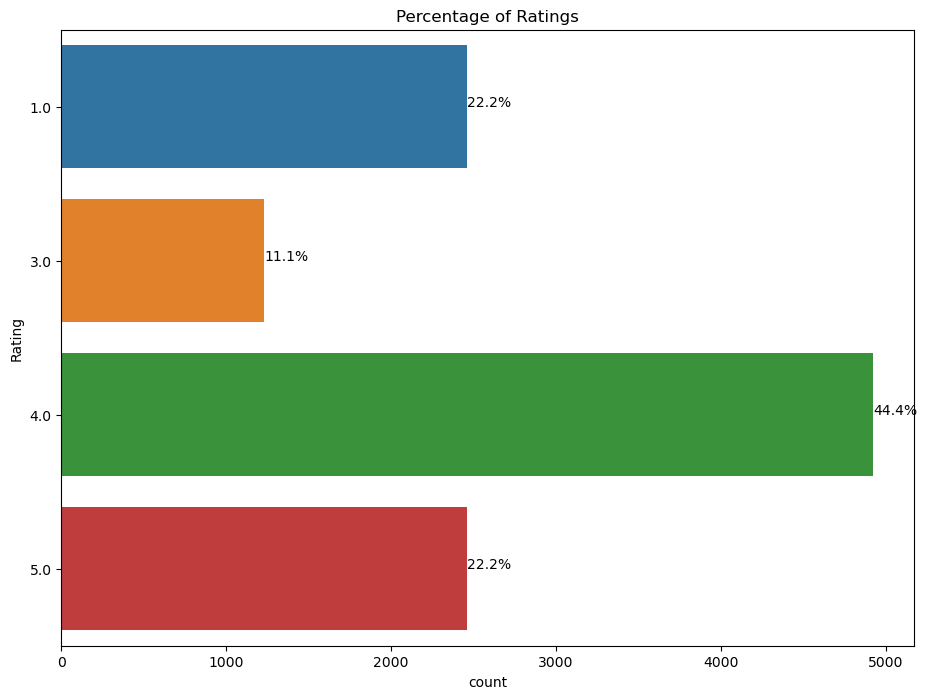

In [46]:
plt.figure(figsize=(11,8))
plt.title('Percentage of Ratings')
ax = sns.countplot(y = 'Rating', data = reviews)
total = len(reviews)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

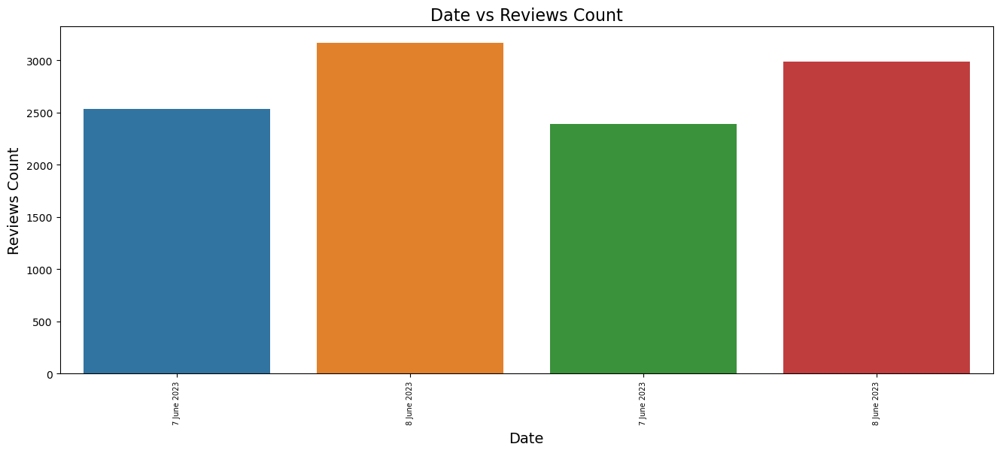

In [47]:
dayreview = pd.DataFrame(reviews.groupby('Review_Date')['Review'].count()).reset_index()
dayreview['Date'] = dayreview['Review_Date']
dayreview.sort_values(by = ['Review_Date'])

#Plotting the graph
plt.figure(figsize=(16,6))
sns.barplot(x = "Date", y = "Review", data = dayreview)
plt.title('Date vs Reviews Count', fontsize=16)
plt.xticks(rotation=90,fontsize=7)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Reviews Count',fontsize=14)
plt.show()

## BasicText Preprocessing for Sentiment Analysis

In [50]:
df = reviews.copy()
def clean_text(text):
    Review = re.sub(r'@[A-Z_a-z_0-9_]+', '', text)
    Review = re.sub(r'https?:\/\/\S+', '', text)
    Review = re.sub(r'#', '', text)     
    Review = text.lower()
    return Review

df = reviews['Review'].apply(clean_text)
df

0        please permanently remove blotware and unwante...
1              charging is fast ⏩ and long-lasting battery
2                            after 1week phone was hanging
3        too much hanging while general usage.. waste o...
4                                                     like
                               ...                        
12304                                                 like
12305                  product is ok in given price range.
12306    worst part is finger print sensor, not working...
12308              good phone nice camera good battry life
12309    this phone provides good camera quality but wh...
Name: Review, Length: 11079, dtype: object

In [51]:
def thorough_clean(text):
    Review = re.sub('[^A-Za-z0-9]', ' ', text)
    return(Review)

df = reviews['Review'].apply(thorough_clean)
df

0        Please permanently remove blotware and unwante...
1              Charging is fast   and long lasting battery
2                            After 1week phone was hanging
3        Too much hanging while general usage   waste o...
4                                                     Like
                               ...                        
12304                                                 Like
12305                  Product is ok in given price range 
12306    Worst part is Finger print sensor  not working...
12308              Good phone nice camera good battry life
12309    This phone provides good camera quality but wh...
Name: Review, Length: 11079, dtype: object

In [52]:
freq_uncleaned = pd.Series(' '.join(df).split()).value_counts()[:20]
freq_uncleaned

and        7386
phone      6155
good       4924
while      4924
camera     3693
is         3693
it         3693
with       2462
a          2462
in         2462
not        2462
price      2462
range      2462
lag        2462
part       2462
some       2462
sensor     2462
hanging    2462
know       2462
fast       2462
dtype: int64

In [53]:
stop = pd.read_csv('stop.txt', encoding = "ISO-8859-1")
stop.head(7)

,a
0,a's
1,able
2,about
3,above
4,according
5,accordingly
6,across


In [54]:
stop = [a.strip() for a in stop.a]
stop = [a for a in stop if a]
stop[0:10]

["a's",
 'able',
 'about',
 'above',
 'according',
 'accordingly',
 'across',
 'actually',
 'after',
 'afterwards']

In [55]:
final = df.copy()

In [56]:
final

0        Please permanently remove blotware and unwante...
1              Charging is fast   and long lasting battery
2                            After 1week phone was hanging
3        Too much hanging while general usage   waste o...
4                                                     Like
                               ...                        
12304                                                 Like
12305                  Product is ok in given price range 
12306    Worst part is Finger print sensor  not working...
12308              Good phone nice camera good battry life
12309    This phone provides good camera quality but wh...
Name: Review, Length: 11079, dtype: object

In [57]:
final = df.apply(lambda x: " ".join(x for x in x.split() if x not in stop))

In [58]:
final

0        Please permanently remove blotware unwanted ad...
1                       Charging fast long lasting battery
2                                After 1week phone hanging
3        Too hanging general usage waste money camera c...
4                                                     Like
                               ...                        
12304                                                 Like
12305                                  Product price range
12306    Worst part Finger print sensor working expecte...
12308              Good phone nice camera good battry life
12309    This phone good camera quality recording a 60f...
Name: Review, Length: 11079, dtype: object

In [59]:
freq_cleaned = pd.Series(' '.join(final).split()).value_counts()[:20] # for top 20
freq_cleaned

phone        6155
good         4924
camera       3693
fast         2462
price        2462
hanging      2462
battery      2462
a            2462
lag          2462
range        2462
part         2462
sensor       2462
quality      1231
shows        1231
recording    1231
This         1231
life         1231
60fps        1231
battry       1231
nice         1231
dtype: int64

In [149]:
vectorizer = CountVectorizer(min_df = 1, max_df = 0.9)
X = vectorizer.fit_transform(final)
print(X.toarray())

TypeError: 'int' object is not callable

In [61]:
vocab = vectorizer.vocabulary_
vocab

{'please': 43,
 'permanently': 40,
 'remove': 52,
 'blotware': 10,
 'unwanted': 60,
 'adds': 3,
 'apps': 7,
 'clean': 14,
 'ui': 58,
 'interface': 28,
 'charging': 13,
 'fast': 19,
 'long': 35,
 'lasting': 32,
 'battery': 8,
 'after': 4,
 '1week': 0,
 'phone': 41,
 'hanging': 26,
 'too': 57,
 'general': 23,
 'usage': 61,
 'waste': 63,
 'money': 36,
 'camera': 12,
 'calrity': 11,
 'good': 24,
 'draining': 17,
 'like': 34,
 'product': 46,
 'price': 44,
 'range': 50,
 'worst': 65,
 'part': 38,
 'finger': 20,
 'print': 45,
 'sensor': 53,
 'working': 64,
 'expected': 18,
 '20k': 1,
 'nice': 37,
 'battry': 9,
 'life': 33,
 'this': 56,
 'quality': 49,
 'recording': 51,
 '60fps': 2,
 'video': 62,
 'shows': 54,
 'lag': 31,
 'issue': 30,
 'don': 16,
 'iqoo': 29,
 'team': 55,
 'fixed': 22,
 'unlocking': 59,
 'fingerprint': 21,
 'animation': 5,
 'appears': 6,
 'provided': 47,
 'performance': 39,
 'playing': 42,
 'pubg': 48,
 'cod': 15,
 'high': 27,
 'graphics': 25}

In [62]:
vectorizer = TfidfVectorizer(stop_words='english', max_features= 1000, max_df = 0.5, smooth_idf=True)

In [63]:
tfidf = vectorizer.fit_transform(final) 
pd.DataFrame(tfidf.toarray())

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
0,0.00000,0.000000,0.00000,0.333333,0.00000,0.00000,0.333333,0.000000,0.000000,0.333333,...,0.00000,0.00000,0.333333,0.00000,0.333333,0.000000,0.00000,0.000000,0.000000,0.000000
1,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.380977,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
2,0.69937,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
3,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.267214,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.341146,0.00000,0.341146,0.000000,0.000000
4,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11074,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
11075,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
11076,0.00000,0.350038,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.350038,0.350038
11077,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.000000,0.427345,0.000000,...,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000


## types of N-gram

In [64]:
def get_top_n1_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(1,1),
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [65]:
top1_words = get_top_n1_words(final, n=100) #top 100
top1_df = pd.DataFrame(top1_words)
top1_df.columns=["one-gram", "Freq"]
top1_df.head()

,one-gram,Freq
0,phone,6155
1,good,6155
2,camera,4924
3,fast,2462
4,battery,2462


In [66]:
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [67]:
top2_words = get_top_n2_words(final, n=200) #top 200
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
top2_df.head()

,Bi-gram,Freq
0,price range,2462
1,please permanently,1231
2,permanently remove,1231
3,remove blotware,1231
4,blotware unwanted,1231


In [68]:
def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3),
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [69]:
top3_words = get_top_n3_words(final, n=200)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]
top3_df.head()

,Tri-gram,Freq
0,please permanently remove,1231
1,permanently remove blotware,1231
2,remove blotware unwanted,1231
3,blotware unwanted adds,1231
4,unwanted adds apps,1231


In [70]:
string_Total = " ".join(final)

In [194]:
from wordcloud import WordCloud, STOPWORDS
clean_reviews2=' '.join(top2_df.get_feature_names())
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud
STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=my_stop_words).generate(clean_reviews2)
plot_cloud(wordcloud)

AttributeError: 'DataFrame' object has no attribute 'get_feature_names'

## Sentimental Analysis

In [72]:
aa= pd.DataFrame(data=final)
aa

,Review
0,Please permanently remove blotware unwanted ad...
1,Charging fast long lasting battery
2,After 1week phone hanging
3,Too hanging general usage waste money camera c...
4,Like
...,...
12304,Like
12305,Product price range
12306,Worst part Finger print sensor working expecte...
12308,Good phone nice camera good battry life


In [73]:
from textblob import TextBlob

def get_subjectivity(text):
  return TextBlob(text).sentiment.subjectivity

def get_polarity(text):
  return TextBlob(text).sentiment.polarity

aa['subjectivity'] = aa['Review'].apply(get_subjectivity)
aa['polarity'] = aa['Review'].apply(get_polarity)
aa

,Review,subjectivity,polarity
0,Please permanently remove blotware unwanted ad...,0.700000,0.366667
1,Charging fast long lasting battery,0.333333,0.050000
2,After 1week phone hanging,0.000000,0.000000
3,Too hanging general usage waste money camera c...,0.425000,0.187500
4,Like,0.000000,0.000000
...,...,...,...
12304,Like,0.000000,0.000000
12305,Product price range,0.000000,0.000000
12306,Worst part Finger print sensor working expecte...,0.700000,-0.550000
12308,Good phone nice camera good battry life,0.733333,0.666667


In [74]:
def getanalysis(score):
  if score < 0:
    return 'Negative'
  elif score == 0:
    return 'Neutral'
  elif score > 0:
      return 'Positive'

aa['Analysis'] = aa['polarity'].apply(getanalysis) 
aa

,Review,subjectivity,polarity,Analysis
0,Please permanently remove blotware unwanted ad...,0.700000,0.366667,Positive
1,Charging fast long lasting battery,0.333333,0.050000,Positive
2,After 1week phone hanging,0.000000,0.000000,Neutral
3,Too hanging general usage waste money camera c...,0.425000,0.187500,Positive
4,Like,0.000000,0.000000,Neutral
...,...,...,...,...
12304,Like,0.000000,0.000000,Neutral
12305,Product price range,0.000000,0.000000,Neutral
12306,Worst part Finger print sensor working expecte...,0.700000,-0.550000,Negative
12308,Good phone nice camera good battry life,0.733333,0.666667,Positive


In [75]:
positive = aa[aa['Analysis'] == 'Positive']
positive = positive.sort_values('polarity', ascending = False)
positive

,Review,subjectivity,polarity,Analysis
3078,Good phone nice camera good battry life,0.733333,0.666667,Positive
4538,Good phone nice camera good battry life,0.733333,0.666667,Positive
10158,Good phone nice camera good battry life,0.733333,0.666667,Positive
7768,Good phone nice camera good battry life,0.733333,0.666667,Positive
2148,Good phone nice camera good battry life,0.733333,0.666667,Positive
...,...,...,...,...
3241,Charging fast long lasting battery,0.333333,0.050000,Positive
9061,Charging fast long lasting battery,0.333333,0.050000,Positive
3251,Charging fast long lasting battery,0.333333,0.050000,Positive
9051,Charging fast long lasting battery,0.333333,0.050000,Positive


In [76]:
string_Total = " ".join(positive.Review)

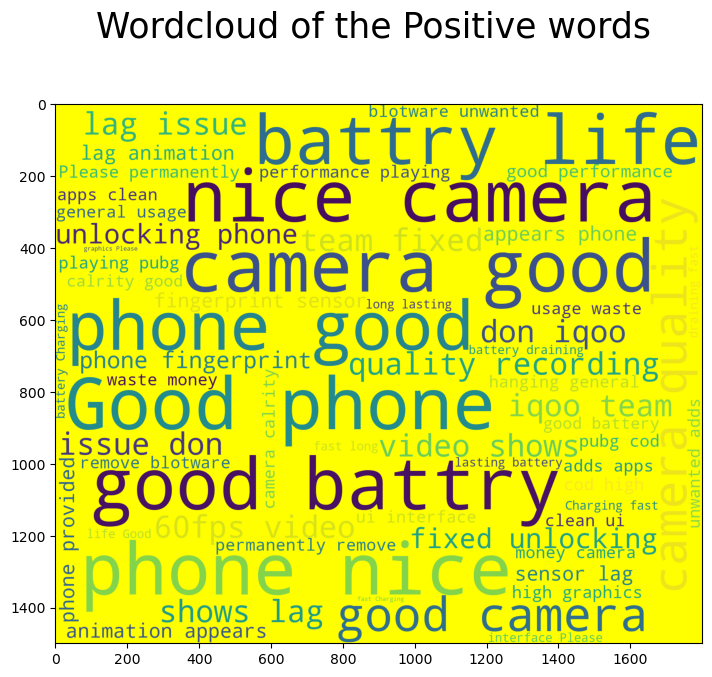

In [77]:
fig = plt.figure(figsize = (15,7))
from wordcloud import WordCloud
wordcloud_stw = WordCloud(
                background_color= 'yellow',
                width = 1800,
                height = 1500, random_state = 10, max_font_size = 200
                ).generate(string_Total)
plt.imshow(wordcloud_stw)
plt.title("Wordcloud of the Positive words ", y=1.11, fontsize=25)
plt.show()

In [78]:
negative = aa[aa['Analysis'] == 'Negative']
negative = negative.sort_values('polarity', ascending = False)
negative

,Review,subjectivity,polarity,Analysis
6,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
8186,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
8256,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
8246,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
8236,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
...,...,...,...,...
4096,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
4086,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
4076,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative
4066,Worst part Finger print sensor working expecte...,0.7,-0.55,Negative


In [81]:
string_Total = " ".join(negative.Review)

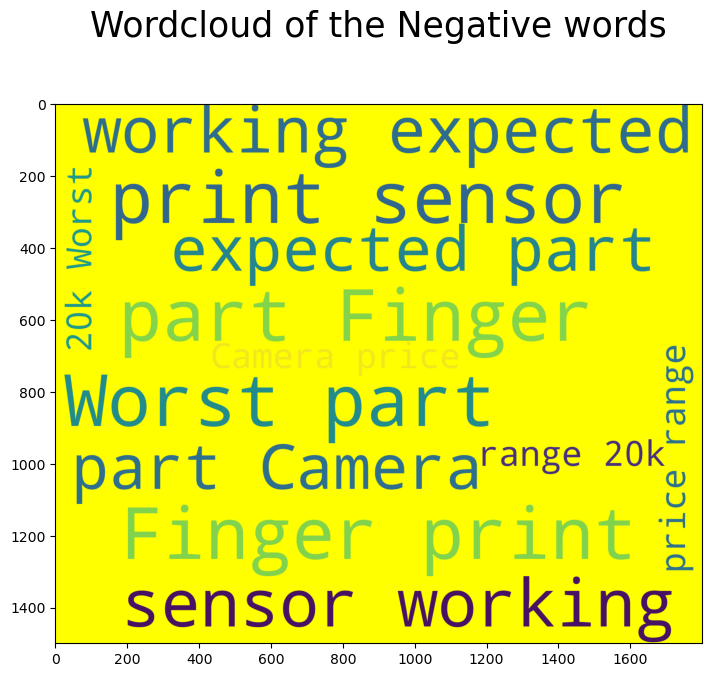

In [80]:
fig = plt.figure(figsize = (15,7))
from wordcloud import WordCloud
wordcloud_stw = WordCloud(
                background_color= 'yellow',
                width = 1800,
                height = 1500, random_state = 10, max_font_size = 200
                ).generate(string_Total)
plt.imshow(wordcloud_stw)
plt.title("Wordcloud of the Negative words", y=1.11, fontsize=25)
plt.show()

In [82]:
Neutral = aa[aa['Analysis'] == 'Neutral']
Neutral = Neutral.sort_values('polarity', ascending = False)
Neutral

,Review,subjectivity,polarity,Analysis
2,After 1week phone hanging,0.0,0.0,Neutral
8175,Product price range,0.0,0.0,Neutral
8184,Like,0.0,0.0,Neutral
8185,Product price range,0.0,0.0,Neutral
8192,After 1week phone hanging,0.0,0.0,Neutral
...,...,...,...,...
4115,Product price range,0.0,0.0,Neutral
4122,After 1week phone hanging,0.0,0.0,Neutral
4124,Like,0.0,0.0,Neutral
4125,Product price range,0.0,0.0,Neutral


In [83]:
print("% of positive tweets:", round((positive.shape[0]/aa.shape[0])*100, 1))
print("% of negative tweets:", round((negative.shape[0]/aa.shape[0])*100, 1))
print("% of positive tweets:", round((Neutral.shape[0]/aa.shape[0])*100, 1)) 

% of positive tweets: 55.6
% of negative tweets: 11.1
% of positive tweets: 33.3


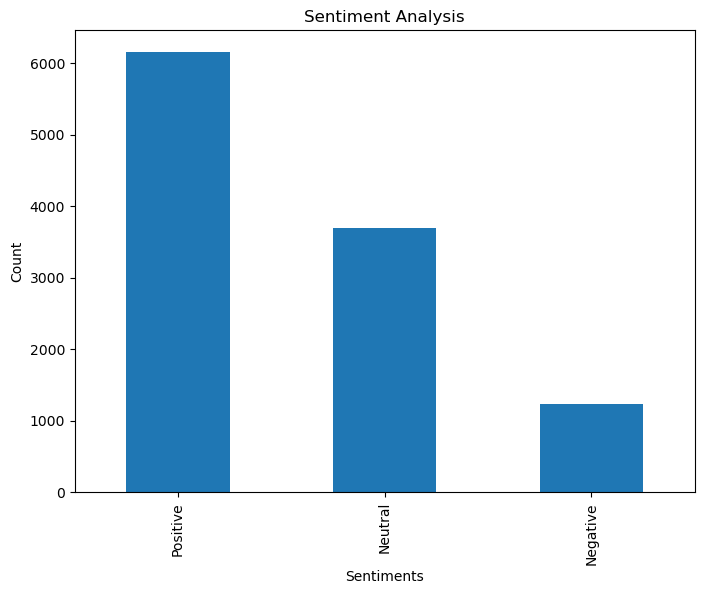

In [84]:
plt.figure(figsize=(8,6))
aa['Analysis'].value_counts().plot(kind='bar')
plt.title("Sentiment Analysis")
plt.xlabel('Sentiments')
plt.ylabel('Count')
plt.show()

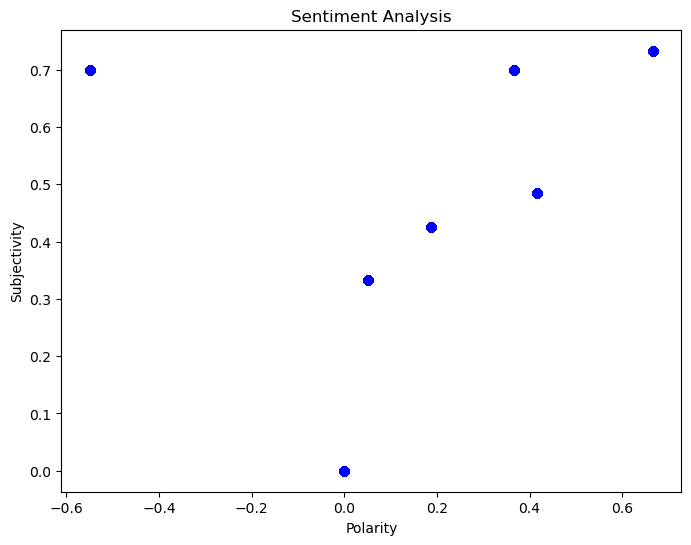

In [92]:
plt.figure(figsize=(8,6))
plt.scatter(aa.polarity, aa.subjectivity, color = 'blue')

plt.title("Sentiment Analysis")
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [101]:
dff= df.copy()

In [130]:
reviews=pd.DataFrame(data=dff)
reviews.head()

,Review
0,Please permanently remove blotware and unwante...
1,Charging is fast and long lasting battery
2,After 1week phone was hanging
3,Too much hanging while general usage waste o...
4,Like


In [131]:
reviews=[Review.strip() for Review in reviews.Review] 
# remove empty strings, because they are considered in Python as False
reviews=[Review for Review in reviews if Review] 
reviews[0:10]

['Please permanently remove blotware and unwanted adds and apps   and clean ui interface',
 'Charging is fast   and long lasting battery',
 'After 1week phone was hanging',
 'Too much hanging while general usage   waste of money camera calrity not good   battery draining very fast',
 'Like',
 'Product is ok in given price range',
 'Worst part is Finger print sensor  not working as expected best part if Camera in this price range under 20k  then go for it',
 'Good phone nice camera good battry life',
 'This phone provides good camera quality but while recording a 60fps video it s shows some lag issue don t know why but iqoo team need to fixed it soon and also while unlocking phone with fingerprint sensor some lag animation appears often and until know the phone has provided a good performance while playing pubg or cod with high graphics',
 'Please permanently remove blotware and unwanted adds and apps   and clean ui interface']

In [132]:
reviews_text=' '.join(reviews)
reviews_text

'Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging while general usage   waste of money camera calrity not good   battery draining very fast Like Product is ok in given price range Worst part is Finger print sensor  not working as expected best part if Camera in this price range under 20k  then go for it Good phone nice camera good battry life This phone provides good camera quality but while recording a 60fps video it s shows some lag issue don t know why but iqoo team need to fixed it soon and also while unlocking phone with fingerprint sensor some lag animation appears often and until know the phone has provided a good performance while playing pubg or cod with high graphics Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging while g

In [133]:
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging while general usage   waste of money camera calrity not good   battery draining very fast Like Product is ok in given price range Worst part is Finger print sensor  not working as expected best part if Camera in this price range under 20k  then go for it Good phone nice camera good battry life This phone provides good camera quality but while recording a 60fps video it s shows some lag issue don t know why but iqoo team need to fixed it soon and also while unlocking phone with fingerprint sensor some lag animation appears often and until know the phone has provided a good performance while playing pubg or cod with high graphics Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging while g

In [134]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])
len(text_tokens)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['Please', 'permanently', 'remove', 'blotware', 'and', 'unwanted', 'adds', 'and', 'apps', 'and', 'clean', 'ui', 'interface', 'Charging', 'is', 'fast', 'and', 'long', 'lasting', 'battery', 'After', '1week', 'phone', 'was', 'hanging', 'Too', 'much', 'hanging', 'while', 'general', 'usage', 'waste', 'of', 'money', 'camera', 'calrity', 'not', 'good', 'battery', 'draining', 'very', 'fast', 'Like', 'Product', 'is', 'ok', 'in', 'given', 'price', 'range']


174802

In [135]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Please', 'permanently', 'remove', 'blotware', 'unwanted', 'adds', 'apps', 'clean', 'ui', 'interface', 'Charging', 'fast', 'long', 'lasting', 'battery', 'After', '1week', 'phone', 'hanging', 'Too', 'much', 'hanging', 'general', 'usage', 'waste', 'money', 'camera', 'calrity', 'good', 'battery', 'draining', 'fast', 'Like', 'Product', 'ok', 'given', 'price', 'range', 'Worst', 'part', 'Finger', 'print', 'sensor', 'working', 'expected', 'best', 'part', 'Camera', 'price', 'range', '20k', 'go', 'Good', 'phone', 'nice', 'camera', 'good', 'battry', 'life', 'This', 'phone', 'provides', 'good', 'camera', 'quality', 'recording', '60fps', 'video', 'shows', 'lag', 'issue', 'know', 'iqoo', 'team', 'need', 'fixed', 'soon', 'also', 'unlocking', 'phone', 'fingerprint', 'sensor', 'lag', 'animation', 'appears', 'often', 'know', 'phone', 'provided', 'good', 'performance', 'playing', 'pubg', 'cod', 'high', 'graphics', 'Please', 'permanently', 'remove', 'blotware', 'unwanted', 'adds', 'apps', 'clean', 'ui',

In [136]:
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['please', 'permanently', 'remove', 'blotware', 'unwanted', 'adds', 'apps', 'clean', 'ui', 'interface', 'charging', 'fast', 'long', 'lasting', 'battery', 'after', '1week', 'phone', 'hanging', 'too', 'much', 'hanging', 'general', 'usage', 'waste', 'money', 'camera', 'calrity', 'good', 'battery', 'draining', 'fast', 'like', 'product', 'ok', 'given', 'price', 'range', 'worst', 'part', 'finger', 'print', 'sensor', 'working', 'expected', 'best', 'part', 'camera', 'price', 'range', '20k', 'go', 'good', 'phone', 'nice', 'camera', 'good', 'battry', 'life', 'this', 'phone', 'provides', 'good', 'camera', 'quality', 'recording', '60fps', 'video', 'shows', 'lag', 'issue', 'know', 'iqoo', 'team', 'need', 'fixed', 'soon', 'also', 'unlocking', 'phone', 'fingerprint', 'sensor', 'lag', 'animation', 'appears', 'often', 'know', 'phone', 'provided', 'good', 'performance', 'playing', 'pubg', 'cod', 'high', 'graphics', 'please', 'permanently', 'remove', 'blotware', 'unwanted', 'adds', 'apps', 'clean', 'ui',

In [137]:
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['pleas', 'perman', 'remov', 'blotwar', 'unwant', 'add', 'app', 'clean', 'ui', 'interfac', 'charg', 'fast', 'long', 'last', 'batteri', 'after', '1week', 'phone', 'hang', 'too', 'much', 'hang', 'gener', 'usag', 'wast', 'money', 'camera', 'calriti', 'good', 'batteri', 'drain', 'fast', 'like', 'product', 'ok', 'given', 'price', 'rang', 'worst', 'part', 'finger', 'print', 'sensor', 'work', 'expect', 'best', 'part', 'camera', 'price', 'rang', '20k', 'go', 'good', 'phone', 'nice', 'camera', 'good', 'battri', 'life', 'thi', 'phone', 'provid', 'good', 'camera', 'qualiti', 'record', '60fp', 'video', 'show', 'lag', 'issu', 'know', 'iqoo', 'team', 'need', 'fix', 'soon', 'also', 'unlock', 'phone', 'fingerprint', 'sensor', 'lag', 'anim', 'appear', 'often', 'know', 'phone', 'provid', 'good', 'perform', 'play', 'pubg', 'cod', 'high', 'graphic', 'pleas', 'perman', 'remov', 'blotwar', 'unwant', 'add', 'app', 'clean', 'ui', 'interfac', 'charg', 'fast', 'long', 'last', 'batteri', 'after', '1week', 'phone

In [138]:
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['please', 'permanently', 'remove', 'blotware', 'unwanted', 'add', 'app', 'clean', 'ui', 'interface', 'charge', 'fast', 'long', 'last', 'battery', 'after', '1week', 'phone', 'hanging', 'too', 'much', 'hang', 'general', 'usage', 'waste', 'money', 'camera', 'calrity', 'good', 'battery', 'drain', 'fast', 'like', 'product', 'ok', 'give', 'price', 'range', 'bad', 'part', 'finger', 'print', 'sensor', 'work', 'expect', 'good', 'part', 'camera', 'price', 'range', '20k', 'go', 'good', 'phone', 'nice', 'camera', 'good', 'battry', 'life', 'this', 'phone', 'provide', 'good', 'camera', 'quality', 'recording', '60fps', 'video', 'show', 'lag', 'issue', 'know', 'iqoo', 'team', 'need', 'fix', 'soon', 'also', 'unlock', 'phone', 'fingerprint', 'sensor', 'lag', 'animation', 'appear', 'often', 'know', 'phone', 'provide', 'good', 'performance', 'play', 'pubg', 'cod', 'high', 'graphic', 'please', 'permanently', 'remove', 'blotware', 'unwanted', 'add', 'app', 'clean', 'ui', 'interface', 'charge', 'fast', 'lon

In [205]:
clean_reviews=' '.join(lemmas)
clean_reviews

'please permanently remove blotware unwanted add app clean ui interface charge fast long last battery after 1week phone hanging too much hang general usage waste money camera calrity good battery drain fast like product ok give price range bad part finger print sensor work expect good part camera price range 20k go good phone nice camera good battry life this phone provide good camera quality recording 60fps video show lag issue know iqoo team need fix soon also unlock phone fingerprint sensor lag animation appear often know phone provide good performance play pubg cod high graphic please permanently remove blotware unwanted add app clean ui interface charge fast long last battery after 1week phone hanging too much hang general usage waste money camera calrity good battery drain fast like product ok give price range bad part finger print sensor work expect good part camera price range 20k go good phone nice camera good battry life this phone provide good camera quality recording 60fps 

In [206]:
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)
print(cv.vocabulary_)
print(cv.get_feature_names()[150:300])
print(reviewscv.toarray()[150:300])
print(reviewscv.toarray().shape)

{'please': 52, 'permanently': 49, 'remove': 61, 'blotware': 12, 'unwanted': 70, 'add': 3, 'app': 7, 'clean': 16, 'ui': 68, 'interface': 32, 'charge': 15, 'fast': 20, 'long': 40, 'last': 37, 'battery': 10, 'after': 4, '1week': 0, 'phone': 50, 'hanging': 30, 'too': 67, 'much': 42, 'hang': 29, 'general': 24, 'usage': 71, 'waste': 73, 'money': 41, 'camera': 14, 'calrity': 13, 'good': 27, 'drain': 18, 'like': 39, 'product': 55, 'ok': 46, 'give': 25, 'price': 53, 'range': 59, 'bad': 9, 'part': 47, 'finger': 21, 'print': 54, 'sensor': 62, 'work': 74, 'expect': 19, '20k': 1, 'go': 26, 'nice': 44, 'battry': 11, 'life': 38, 'this': 66, 'provide': 56, 'quality': 58, 'recording': 60, '60fps': 2, 'video': 72, 'show': 63, 'lag': 36, 'issue': 34, 'know': 35, 'iqoo': 33, 'team': 65, 'need': 43, 'fix': 23, 'soon': 64, 'also': 5, 'unlock': 69, 'fingerprint': 22, 'animation': 6, 'appear': 8, 'often': 45, 'performance': 48, 'play': 51, 'pubg': 57, 'cod': 17, 'high': 31, 'graphic': 28}
[]
[[0 0 0 ... 0 0 0

In [207]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(2,2),max_features=100,stop_words=my_stop_words)
bow_matrix_ngram=cv_ngram_range.fit_transform(reviews)
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['1week phone', '20k go', '60fps video', 'adds apps', 'also unlocking', 'animation appears', 'appears often', 'apps clean', 'battery draining', 'battry life', 'best part', 'blotware unwanted', 'calrity good', 'camera calrity', 'camera good', 'camera price', 'camera quality', 'charging fast', 'clean ui', 'cod high', 'draining fast', 'expected best', 'fast long', 'finger print', 'fingerprint sensor', 'fixed soon', 'general usage', 'given price', 'good battery', 'good battry', 'good camera', 'good performance', 'good phone', 'hanging general', 'high graphics', 'iqoo team', 'issue know', 'know iqoo', 'know phone', 'lag animation', 'lag issue', 'lasting battery', 'long lasting', 'money camera', 'much hanging', 'need fixed', 'nice camera', 'often know', 'ok given', 'part camera', 'part finger', 'performance playing', 'permanently remove', 'phone fingerprint', 'phone hanging', 'phone nice', 'phone provided', 'phone provides', 'playing pubg', 'please permanently', 'price range', 'print sensor'

In [208]:
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(2,3),max_features=100,stop_words=my_stop_words)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(reviews)
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['1week phone', 'best part camera', 'blotware unwanted', 'blotware unwanted adds', 'calrity good', 'calrity good battery', 'camera calrity', 'camera calrity good', 'camera good', 'camera good battry', 'camera price', 'camera price range', 'camera quality', 'camera quality recording', 'charging fast', 'charging fast long', 'clean ui', 'clean ui interface', 'cod high', 'cod high graphics', 'lag issue know', 'long lasting', 'long lasting battery', 'money camera', 'money camera calrity', 'much hanging', 'much hanging general', 'need fixed', 'need fixed soon', 'nice camera', 'nice camera good', 'often know', 'often know phone', 'ok given', 'ok given price', 'part camera', 'part camera price', 'part finger', 'part finger print', 'performance playing', 'performance playing pubg', 'permanently remove', 'permanently remove blotware', 'phone fingerprint', 'phone fingerprint sensor', 'phone hanging', 'phone nice', 'phone nice camera', 'phone provided', 'phone provided good', 'phone provides', 'ph

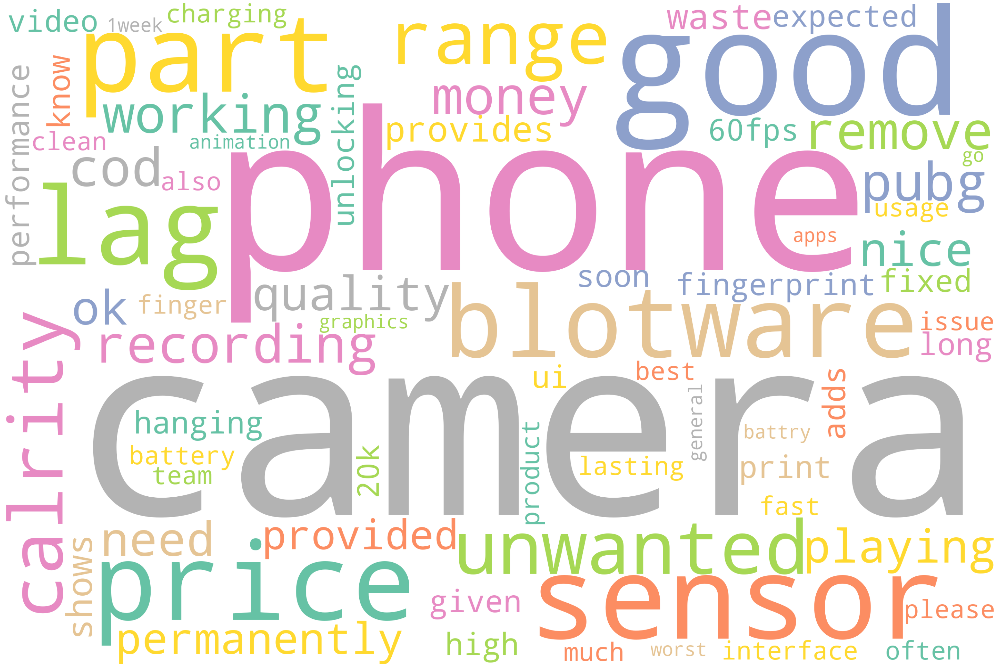

In [209]:
from wordcloud import WordCloud, STOPWORDS
clean_reviews2=' '.join(tfidfv_ngram_max_features.get_feature_names())
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud
STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=my_stop_words).generate(clean_reviews2)
plot_cloud(wordcloud)

In [217]:
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [218]:
for token in doc_block[100:200]:
    print(token,token.pos_)

unwanted ADJ
add VERB
app NOUN
clean PROPN
ui PROPN
interface PROPN
charge NOUN
fast ADV
long ADV
last ADJ
battery NOUN
after SCONJ
1week NUM
phone NOUN
hanging NOUN
too ADV
much ADV
hang VERB
general ADJ
usage NOUN
waste NOUN
money NOUN
camera NOUN
calrity NOUN
good ADJ
battery NOUN
drain NOUN
fast ADV
like ADP
product NOUN
ok INTJ
give VERB
price NOUN
range NOUN
bad ADJ
part NOUN
finger NOUN
print NOUN
sensor NOUN
work NOUN
expect VERB
good ADJ
part NOUN
camera NOUN
price NOUN
range NOUN
20k NOUN
go VERB
good ADJ
phone NOUN
nice ADJ
camera NOUN
good ADJ
battry NOUN
life NOUN
this DET
phone NOUN
provide VERB
good ADJ
camera NOUN
quality NOUN
recording NOUN
60fps NOUN
video NOUN
show NOUN
lag NOUN
issue NOUN
know VERB
iqoo NOUN
team NOUN
need VERB
fix NOUN
soon ADV
also ADV
unlock VERB
phone NOUN
fingerprint NOUN
sensor NOUN
lag NOUN
animation NOUN
appear VERB
often ADV
know VERB
phone NOUN
provide VERB
good ADJ
performance NOUN
play VERB
pubg NOUN
cod VERB
high ADJ
graphic NOUN
please

In [219]:
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['battry', 'life', 'phone', 'provide', 'camera', 'quality', 'recording', '60fps', 'video', 'show', 'lag', 'issue', 'know', 'iqoo', 'team', 'need', 'fix', 'unlock', 'phone', 'fingerprint', 'sensor', 'lag', 'animation', 'appear', 'know', 'phone', 'provide', 'performance', 'play', 'pubg', 'cod', 'graphic', 'remove', 'blotware', 'add', 'app', 'charge', 'battery', 'phone', 'hanging', 'hang', 'usage', 'waste', 'money', 'camera', 'calrity', 'battery', 'drain', 'product', 'give', 'price', 'range', 'part', 'finger', 'print', 'sensor', 'work', 'expect', 'part', 'camera', 'price', 'range', '20k', 'go', 'phone', 'camera', 'battry', 'life', 'phone', 'provide', 'camera', 'quality', 'recording', '60fps', 'video', 'show', 'lag', 'issue', 'know', 'iqoo', 'team', 'need', 'fix', 'unlock', 'phone', 'fingerprint', 'sensor', 'lag', 'animation', 'appear', 'know', 'phone', 'provide', 'performance', 'play', 'pubg', 'cod', 'graphic', 'remove', 'blotware']


In [220]:
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,phone,6155
1,camera,4924
2,battery,2462
3,price,2462
4,range,2462
5,part,2462
6,sensor,2462
7,provide,2462
8,lag,2462
9,know,2462


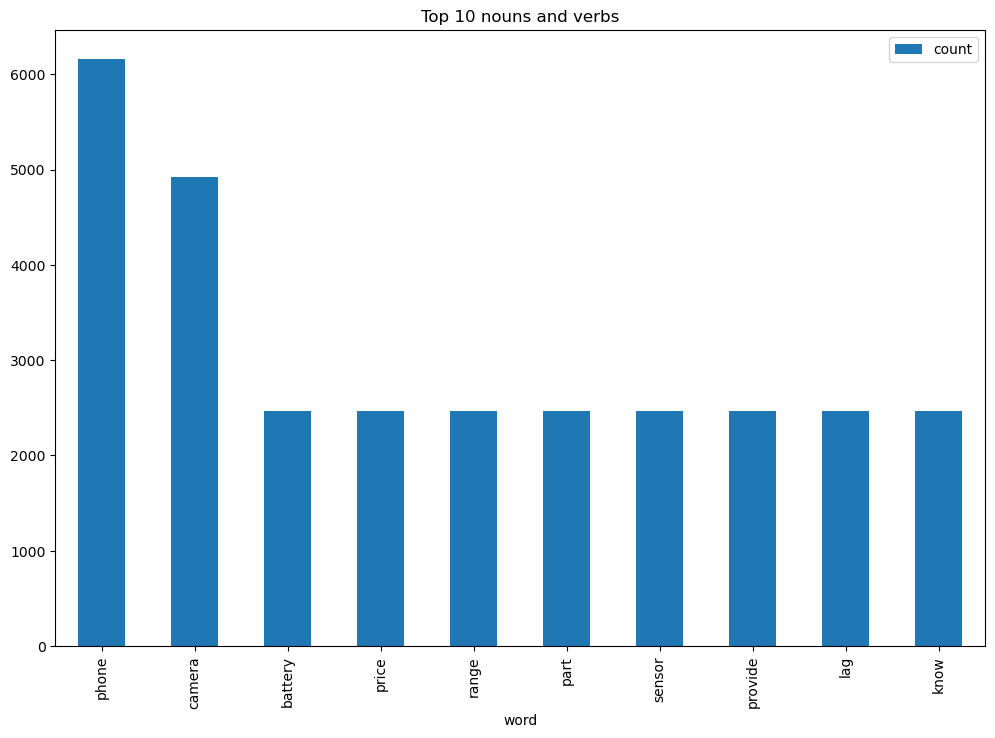

In [221]:
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

In [224]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(dff))
sentences

['Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging while general usage   waste of money camera calrity not good   battery draining very fast   Like Product is ok in given price range  Worst part is Finger print sensor  not working as expected best part if Camera in this price range under 20k  then go for it Good phone nice camera good battry life This phone provides good camera quality but while recording a 60fps video it s shows some lag issue don t know why but iqoo team need to fixed it soon and also while unlocking phone with fingerprint sensor some lag animation appears often and until know the phone has provided a good performance while playing pubg or cod with high graphics  Please permanently remove blotware and unwanted adds and apps   and clean ui interface Charging is fast   and long lasting battery After 1week phone was hanging Too much hanging wh

In [226]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Please permanently remove blotware and unwante...
